In [1]:
! pip install opencv-python
! pip install ftfy regex tqdm
! pip install streamlit
! pip install torchray

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import torch
from model import build_model
from clip_ import load, tokenize
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import streamlit as st
from torchray.attribution.grad_cam import grad_cam
from matplotlib import rc
import os
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import matplotlib

In [3]:
torch.cuda.is_available()

True

In [4]:
def show_cam_on_image(img, mask, neg_saliency=False):
    if neg_saliency:
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_RAINBOW)
    else:
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam

def show_overlapped_cam(img, neg_mask, pos_mask):
    neg_heatmap = cv2.applyColorMap(np.uint8(255 * neg_mask), cv2.COLORMAP_RAINBOW)
    pos_heatmap = cv2.applyColorMap(np.uint8(255 * pos_mask), cv2.COLORMAP_JET)
    neg_heatmap = np.float32(neg_heatmap) / 255
    pos_heatmap = np.float32(pos_heatmap) / 255
    # try different options: sum, average, ...
    heatmap = neg_heatmap + pos_heatmap
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam

In [5]:
def vit_relevance(image, text, model, device, neg_saliency=False, index=None):

    model.visual.eval()
    
    image_features = model.encode_image(image)
    text_features = model.encode_text(text)

    image_features_norm = image_features.norm(dim=-1, keepdim=True)
    image_features_new = image_features / image_features_norm
    text_features_norm = text_features.norm(dim=-1, keepdim=True)
    text_features_new = text_features / text_features_norm
    
    similarity = image_features_new[0].dot(text_features_new[0])
 
    if neg_saliency:
        objective = 1-similarity
    else:
        objective = similarity
        
 
    
    model.visual.zero_grad()
    objective.backward(retain_graph=True)
 
    image_attn_blocks = list(dict(model.visual.transformer.resblocks.named_children()).values())
    num_tokens = image_attn_blocks[0].attn_probs.shape[-1]
    
    R = torch.eye(num_tokens, num_tokens, dtype=image_attn_blocks[0].attn_probs.dtype).to(device)
    grad = image_attn_blocks[-1].attn_grad
    grad = grad.reshape(-1, grad.shape[-1], grad.shape[-1])
    for blk in image_attn_blocks:
        cam = blk.attn_probs
        cam = cam.reshape(-1, cam.shape[-1], cam.shape[-1])
        cam = grad * cam
        cam = cam.clamp(min=0).mean(dim=0) 
        R += torch.matmul(cam, R)
        
    R[0, 0] = 0
    image_relevance = R[0, 1:]
    
    image_relevance = image_relevance.reshape(1, 1, 7, 7)
    image_relevance = torch.nn.functional.interpolate(image_relevance, size=224, mode='bilinear')
    image_relevance = image_relevance.reshape(224, 224).cuda().data.cpu().numpy()
    image_relevance = (image_relevance - image_relevance.min()) / (image_relevance.max() - image_relevance.min())
    image = image[0].permute(1, 2, 0).data.cpu().numpy()
    image = (image - image.min()) / (image.max() - image.min())
    
    return image_relevance, image


In [6]:
def interpret_vit(image, text, model, device, neg_saliency=False, index=None):
    
    image_relevance, image = vit_relevance(image, text, model, device, neg_saliency=neg_saliency, index=index)
    vis = show_cam_on_image(image, image_relevance, neg_saliency=neg_saliency)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

def interpret_vit_overlapped(image, text, model, device, index=None):
    
    pos_image_relevance, _ = vit_relevance(image, text, model, device, neg_saliency=False, index=index)
    neg_image_relevance, image = vit_relevance(image, text, model, device, neg_saliency=True, index=index)

    vis = show_overlapped_cam(image, neg_image_relevance, pos_image_relevance)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

In [7]:
def rn_relevance(image, text, model, device, neg_saliency=False, index=None):   
    
    image_features = model.encode_image(image)
    text_features = model.encode_text(text)
    image_features_norm = image_features.norm(dim=-1, keepdim=True)
    image_features_new = image_features / image_features_norm
    text_features_norm = text_features.norm(dim=-1, keepdim=True)
    text_features_new = text_features / text_features_norm
    
    logit_scale = model.logit_scale.exp()
    logits_per_image = logit_scale * image_features_new @ text_features_new.t()
    probs = logits_per_image.softmax(dim=-1).cpu().detach().numpy().tolist()
    
    if neg:
        objective = -text_features_new
    else:
        objective = text_features_new
        
    objective = (objective * image_features_norm)
    image_relevance = grad_cam(model.visual, image.type(model.dtype), objective, saliency_layer=layer)
        


    image_relevance = image_relevance.reshape(1, 1, 7, 7)
    image_relevance = torch.nn.functional.interpolate(image_relevance, size=224, mode='bilinear')
    image_relevance = image_relevance.reshape(224, 224).cuda().data.cpu().numpy()
    image_relevance = (image_relevance - image_relevance.min()) / (image_relevance.max() - image_relevance.min())
    image = image[0].permute(1, 2, 0).data.cpu().numpy()
    image = (image - image.min()) / (image.max() - image.min())
    
    return image_relevance, image

In [8]:
def interpret_rn(image, text, model, device, neg_saliency=False, index=None):   
   
    image_relevance, image = rn_relevance(image, text, model, device, neg_saliency=neg_saliency, index=index)
    vis = show_cam_on_image(image, image_relevance, neg_saliency=neg_saliency)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)
    
def interpret_rn_overlapped(image, text, model, device, index=None):   
   
    pos_image_relevance, _ = rn_relevance(image, text, model, device, neg_saliency=False, index=index)
    neg_image_relevance, image = rn_relevance(image, text, model, device, neg_saliency=True, index=index)

    vis = show_overlapped_cam(image, neg_image_relevance, pos_image_relevance)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

In [9]:
st.sidebar.header('Options')
alpha = st.sidebar.radio("select alpha", [0.5, 0.7, 0.8], index=1)
layer = st.sidebar.selectbox("select saliency layer", ['layer4.2.relu'], index=0)

device = "cuda" if torch.cuda.is_available() else "cpu"

model_rn, preprocess = load("RN50", device=device, jit=False)
model, preprocess = load("ViT-B/32", device=device, jit=False)

2021-12-03 15:34:17.537 
  command:

    streamlit run /home/mamooler/miniconda/envs/habitat/lib/python3.7/site-packages/ipykernel_launcher.py [ARGUMENTS]


In [10]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [11]:
def sim_score(model, image, texts):
        texts = tokenize(texts).to(device)
        logits_per_image, logits_per_text = model(image, texts)
        probs = logits_per_image.softmax(dim=-1).detach().cpu().numpy()

        return probs[0]

In [19]:
root = "../Images/"
img_ids = ["horse&dog.jpg", "horse&sheep.jpg", "cow&sheep.jpg"]#, "vase_or_face.png", "duck-rabbit.jpeg"]

text_lists = [["a horse", "a dog"],
              ["a horse", "a sheep"],
              ["a cow", "a sheep"],
              ]

model_types = ["ViT"]#, "RN50"]

font = {
    'size': 15,
}

ori_preprocess = Compose([
        Resize((224), interpolation=Image.BICUBIC),
        CenterCrop(size=(224, 224)),
        ToTensor()])
print(preprocess)

Compose(
    Resize(size=224, interpolation=PIL.Image.BICUBIC)
    CenterCrop(size=(224, 224))
    <function _transform.<locals>.<lambda> at 0x7f29a7a5e4d0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


/home/mamooler/miniconda/envs/habitat/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


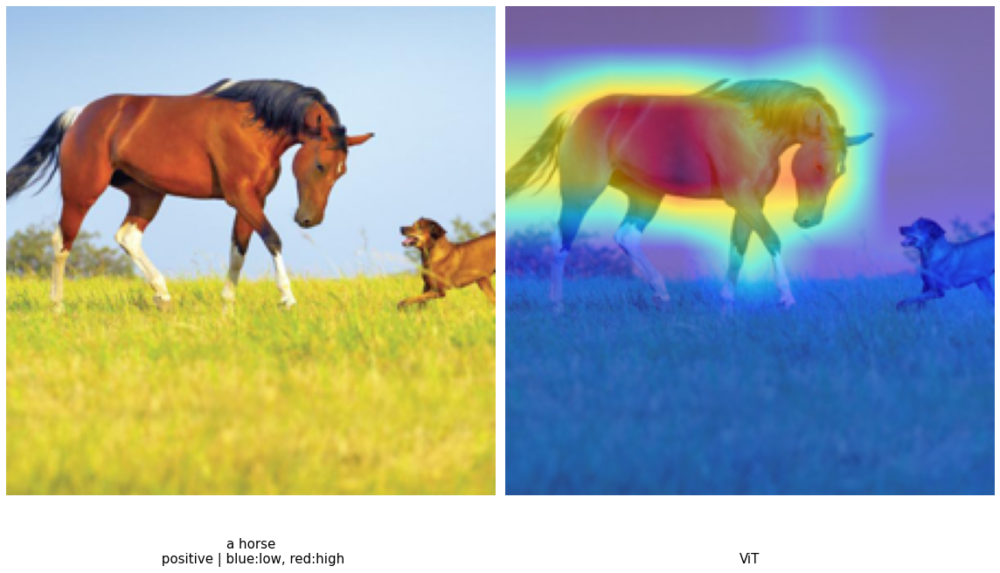

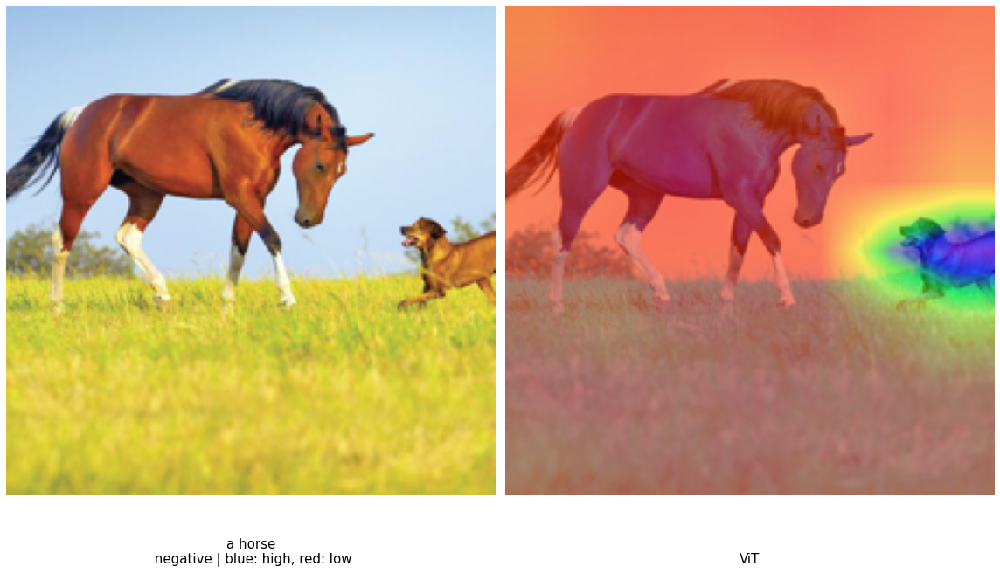

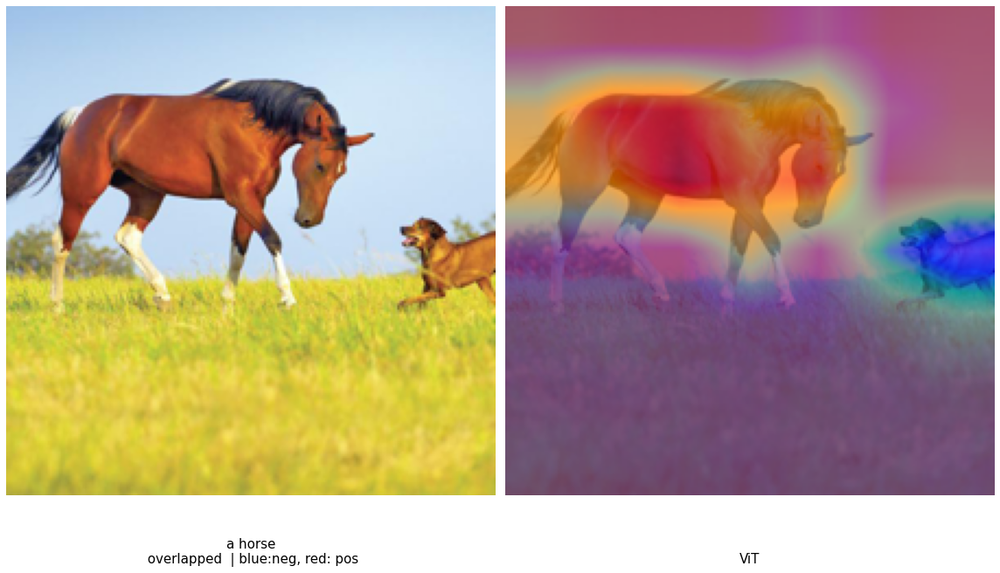

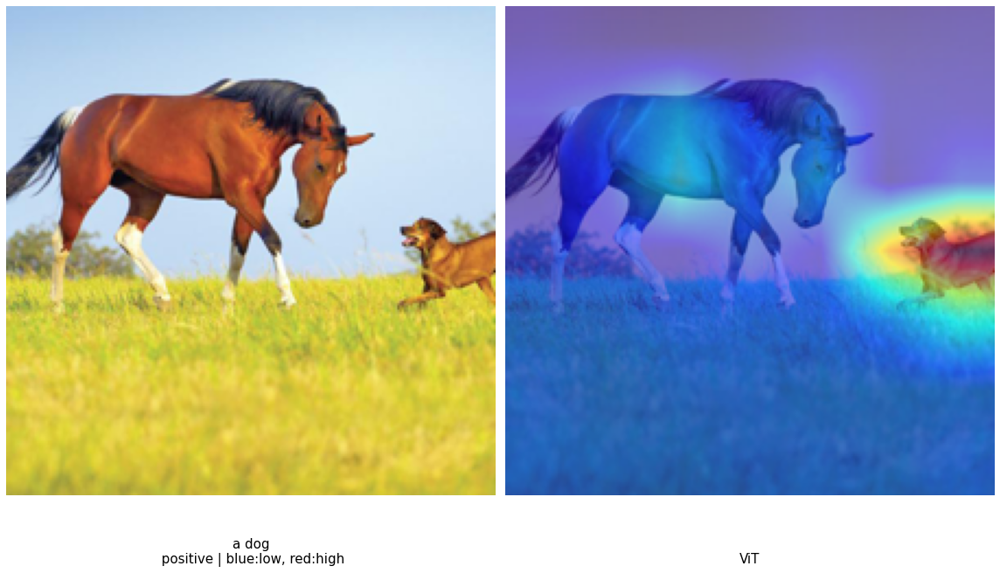

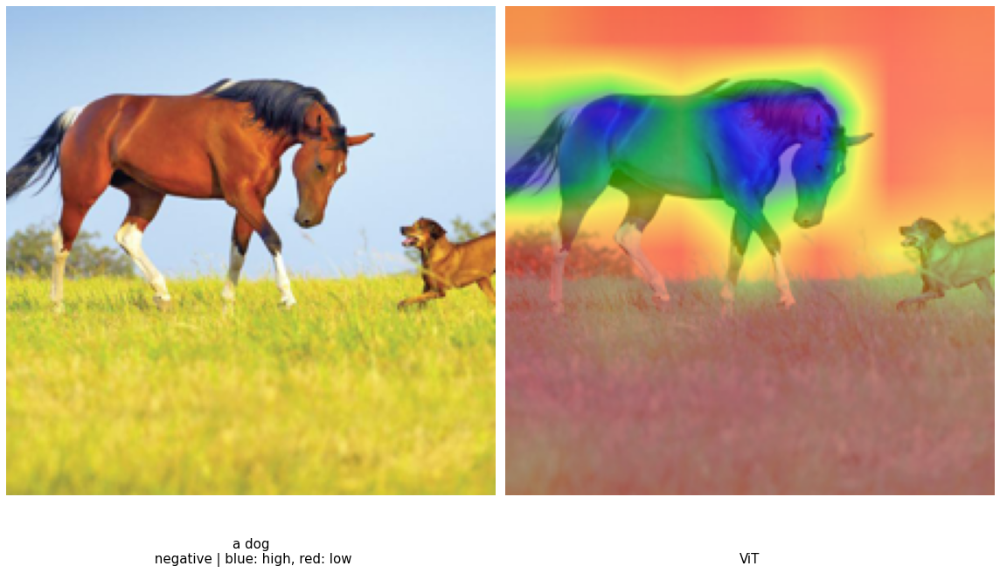

...

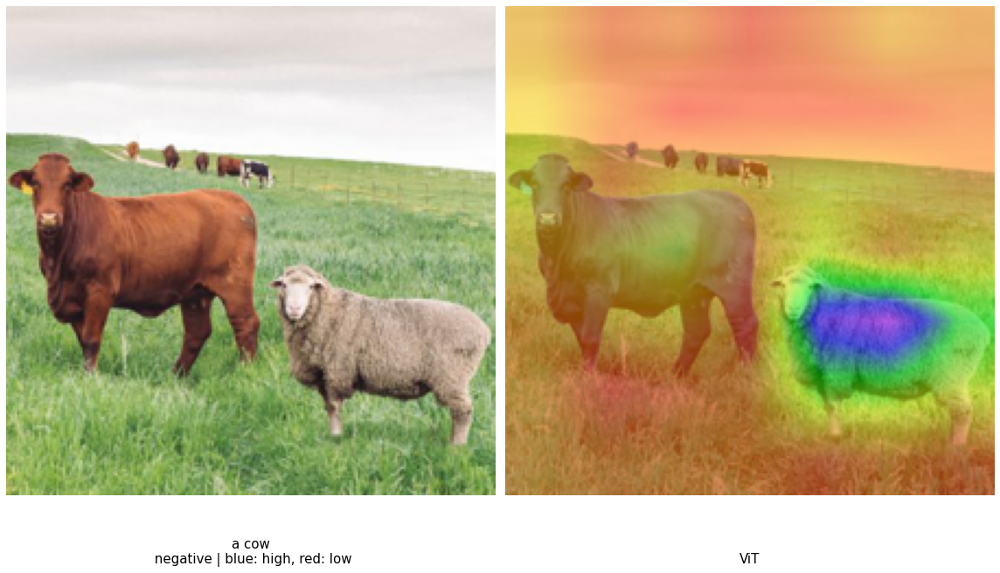

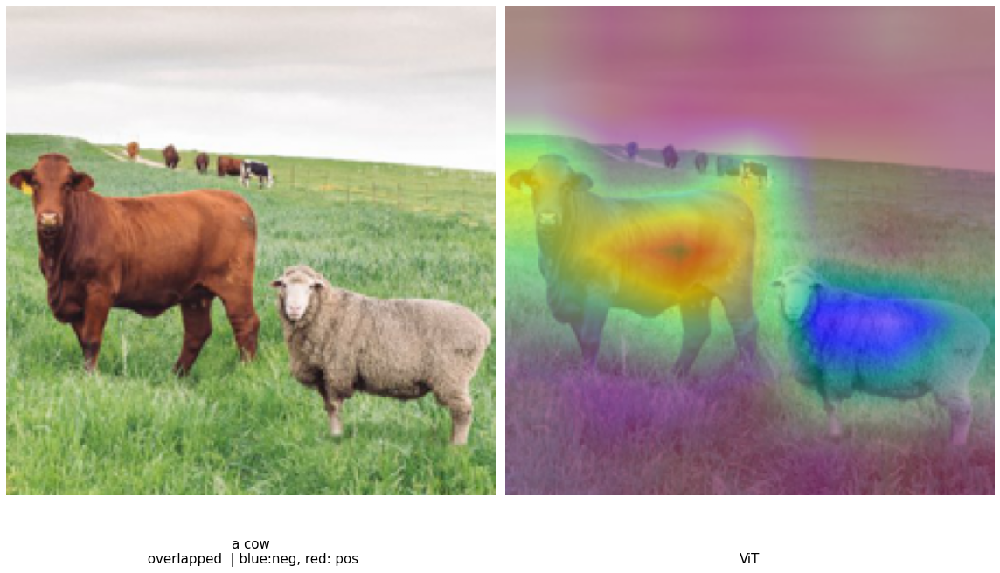

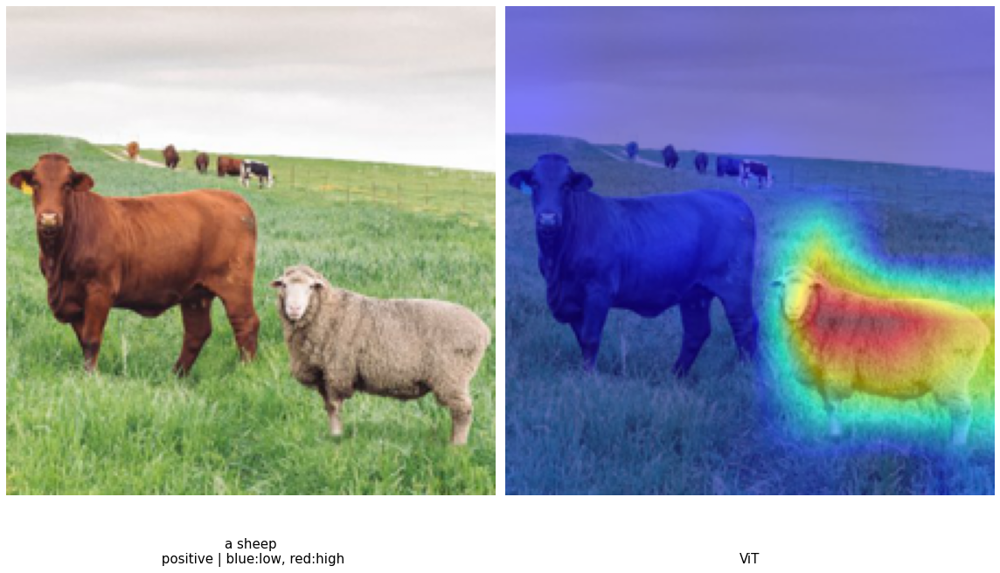

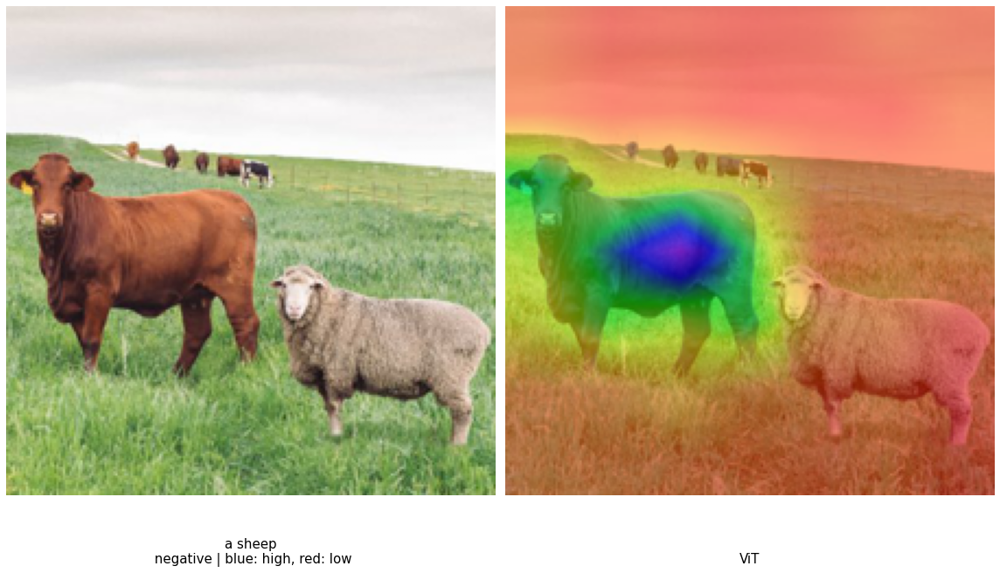

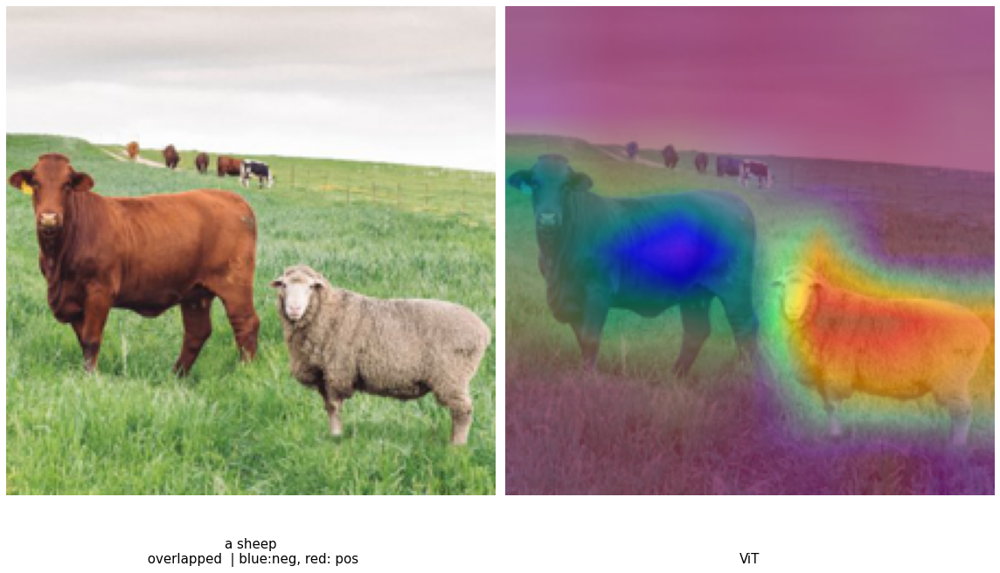

In [20]:
matplotlib.rcParams['mathtext.fontset'] = 'custom'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
# matplotlib.rcParams['mathtext.size'] = 16
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('pos&neg_saliency.pdf')
#fig, ax = plt.subplots(len(2*img_ids), 3, figsize=(16,16))

for id_, img_id in enumerate(img_ids):
    texts = text_lists[id_]
    for t_id, text in enumerate(texts):
        t_text = tokenize(text).to(device)
        
        for neg in [False, True, None]:
            
            img_path =  os.path.join(root, img_id )
            image = ori_preprocess(Image.open(img_path))

            plt.figure(figsize=(16, 16))
            plt.tight_layout()
            plt.subplot(121)
            plt.imshow(image.permute(1, 2, 0))
            plt.axis('off')
            if neg==None: caption = text+"\n overlapped  | blue:neg, red: pos"
            elif neg==True: caption = text+"\n negative | blue: high, red: low"
            else: caption = text+ "\n positive | blue:low, red:high"
            plt.title(caption, **font, y=-0.15)
        
            p_image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)

            subplot = 122
                
            for model_id, model_type in enumerate(model_types):
           
                plt.subplot(subplot+model_id)
            
                if model_type=="ViT":
                    
                    if not neg==None:
                        interpret_vit(model=model, image=p_image, text=t_text, neg_saliency=neg, device=device, index=0)
                    else:
                        interpret_vit_overlapped(model=model, image=p_image, text=t_text, device=device, index=0)

                else:
                        
                    if not neg==None:
                        interpret_rn(model=model_rn, image=p_image, text=t_text, neg_saliency=neg, device=device, index=0)
                    else:
                        interpret_rn_overlapped(model=model_rn, image=p_image, text=t_text, device=device, index=0)
                            
                

                plt.axis('off')
                plt.title(model_type, **font,y=-0.15)
                plt.tight_layout()
                    #dir_path = f'saliency_vis/global_vis/'
                    #if not os.path.exists(dir_path):
                    #    os.mkdir(dir_path)
                    #plt.savefig(f'{dir_path}{model_type}_{img_id}.jpg', bbox_inches='tight')
        pp.savefig()
        
pp.close()

In [14]:
    """"
    texts = tokenize(texts).to(device)
    image_features = model.encode_image(image)
    text_features = model.encode_text(texts)
    image_features = image_features.norm(dim=-1, keepdim=True)
    text_features = text_features.norm(dim=-1, keepdim=True)
    similarities = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    return similarities[0]
    """"

SyntaxError: EOL while scanning string literal (1525139231.py, line 9)